# Image Classification Using CNN: Self Trained vs Pre-trained

This notebook shows the process involved in classifying images using Convolutional Neural Network (CNN).
It contrasts the efficacy of training CNN from scratch with the utilization of transfer learning techniques leveraging pre-trained models.

We explored transfer learning by experimenting with two distinct pre-trained models, namely ResNet50V2 and InceptionV3. The goal was to leverage the learned representations from these models and adapt them to our specific classification task. Our choice of the final model was based on its ability to demonstrate superior performance and generalization ability on our dataset.

Outlined below are the steps we followed for image classification using self-trained and pre-trained models.

1. [Data Preprocessing](#scrollTo=a-xOJH9D9OYJ)
2. [Data Visualisation](#scrollTo=mW0IX4qx-mGX)
3. [Model Training From Scratch](#scrollTo=swkp5qyMMBdF)
4. [Tranfer Learning With InceptionV3](#scrollTo=pcnNKfgwjwZw)
5. [Tranfer Learning With ResNet50V2](#scrollTo=Wu9ab3CIQJNX)
6. [Fine Tuning The Inception Transfer Learning Model](#scrollTo=IvVs0OSv76Ex)
7. [Fine Tuning The Resnet Transfer Learning Model](#scrollTo=YtsHV9sutcaM)
7. [Predictions](#scrollTo=D5mu3_ZVRL1-)
8. [Evaluating The Models](#scrollTo=GgZChh5EYMM6)
9. [Extra - Reloading The Models](#scrollTo=spe8XPBeQd6A)

In [ ]:
# Import the required libraries

# module for interacting with the file system
import os
# pickle would be used to save and load the models and their history
import pickle

# Import TensorFlow and necessary modules for building and training neural networks
import tensorflow as tf
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Conv2D, Dense, Flatten, MaxPool2D, Dropout, GlobalAveragePooling2D, BatchNormalization
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping, ModelCheckpoint

# Import module for loading and preprocessing the images
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Import the pre-trained models to be used for transfer learning
from tensorflow.keras.applications import InceptionV3, ResNet50V2

# Importing utilities for model visualization, numerical computations,
# plotting, and image processing.
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image
import random
from keras.utils import plot_model
from sklearn.metrics import confusion_matrix, classification_report
import time

In [ ]:
# Import the drive module
from google.colab import drive

# Mount the drive at the '/content/drive' directory
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# This would be appended to the file path when saving the models
# to avoid overwriting previously saved models
session_time = int(time.time())

In [ ]:
# Sets all random seeds for Python, NumPy, and TensorFlow to ensure reproducibility.
# Note that there still may be some inconsistencies due to numerical error
# accumulation and the environment the program is running on.
# For instance, utilizing GPU can cause non-deterministic behavior to occur.
# See https://keras.io/examples/keras_recipes/reproducibility_recipes/ for more info
tf.keras.utils.set_random_seed(77)

## Data Preprocessing

We used keras **ImageDataGenerator** to load and preprocess the data, as it streamlines the process of loading and labeling the data. It also offers built-in functionalities like data augmentation and normalization.

To improve the convergence of the optimization algorithms and the overall stability of the training process, we normalize the pixel values by setting the ImageDataGenerator **rescale option to 1./255**, this divides each pixel value by 255, effectively scaling the pixel values to the range [0, 1].

Setting **horizontal_flip=True** in ImageDataGenerator means that for each image in the dataset, there's a 50% chance that it will be flipped horizontally along the vertical axis. It helps increase the diversity of the training data, which can improve the robustness and generalization ability of the model by exposing it to variations.

The **zoom_range** option in the ImageDataGenerator allows us to apply random zoom augmentation to the input images during training. We set the zoom_range to 0.3 to randomly zoom the images by up to 30% in both the horizontal and vertical directions. This means that each image can be scaled by a factor ranging from 0.7 (30% reduction) to 1.3 (30% enlargement) along both axes.
 Zoom augmentation helps introduce variability in the training data, which can improve the model's ability to generalize to new and unseen images.

The horizontal_flip and zoom_range data augmentation is only applied on the training data and not on the validation/test data.

In [ ]:
# Set the base directory where the image data is located
data_directory = "/content/drive/MyDrive/image_classification_keras/"

# Define the directories for training, testing, and prediction datasets
train_dir = os.path.join(data_directory, "seg_train/seg_train")
test_dir = os.path.join(data_directory, "seg_test/seg_test")
pred_dir = os.path.join(data_directory, "seg_pred/seg_pred")

# We choose an input image size of 224 since the ResNet transfer model
# (one of the pre-trained model we would use) requires an input
# image size of  height x width = 224 x 224 pixels.
# InceptionV3 (the other pre-trained model we would use) expects the
# input image size to be 299 x 299, but other input sizes are possible
# within reasonable limits. Since we want to use the same processed data
# for all the models, we chose a size that is compatible for all of them
IMAGE_SHAPE = (224, 224)

# Define the batch size for data loading during training/testing.
# We evaluated the performance of our model on various batch sizes
# before selecting the optimal one for our dataset
BATCH_SIZE = 32

In [ ]:
# Create an ImageDataGenerator instance with rescaling, horizontal flipping, and zoom augmentation
gen_train = ImageDataGenerator(rescale=1./255, horizontal_flip=True, zoom_range=0.3, fill_mode="nearest")

# Generate batches of training data from the specified directory.
# We shuffle the training data before each epoch to prevent the model
# from memorizing the order of the training examples.
train_data_gen = gen_train.flow_from_directory(directory=train_dir,
                                               batch_size=BATCH_SIZE,
                                               target_size=IMAGE_SHAPE,
                                               class_mode="sparse",
                                               shuffle=True
                                               )

Found 14044 images belonging to 6 classes.


In [ ]:
# Create an ImageDataGenerator instance with rescaling augmentation
gen_test = ImageDataGenerator(rescale=1./255)

# Generate batches of test data from the specified directory
test_data_gen = gen_test.flow_from_directory(directory=test_dir,
                                             batch_size=BATCH_SIZE,
                                             target_size=IMAGE_SHAPE,
                                             class_mode="sparse",
                                             shuffle=False
                                             )

Found 3000 images belonging to 6 classes.


## Data Visualisation

Visualization plays a crucial role in understanding the characteristics of the dataset and identifying patterns. We visualised the image data used in our analysis to gain insights into the distribution of classes, the quality of the images, and the features that distinguish different categories.

This helps in making informed decisions about the model design. We utilized matplotlib to display sample images and class distribution plots.

In [ ]:
# Define the variable we would use in creating the visualizations

# Get the class indices mapping from the training data generator
class_indices = train_data_gen.class_indices

# Get the number of unique class labels in the dataset
num_classes = len(class_indices)

# Get the class labels
class_labels = list(train_data_gen.class_indices.keys())

# Get the number of samples in each class for training and test data
train_class_counts = train_data_gen.classes
train_class_counts = [sum(train_class_counts == i) for i in range(len(class_labels))]

test_class_counts = test_data_gen.classes
test_class_counts = [sum(test_class_counts == i) for i in range(len(class_labels))]

# Create a dictionary that maps the class indices to their labels. We swap the keys and values
# of the mapping to enable easy access to the class labels using their integer indices
classes = {val: key for key, val in class_indices.items()}
print(classes)

{0: 'buildings', 1: 'forest', 2: 'glacier', 3: 'mountain', 4: 'sea', 5: 'street'}


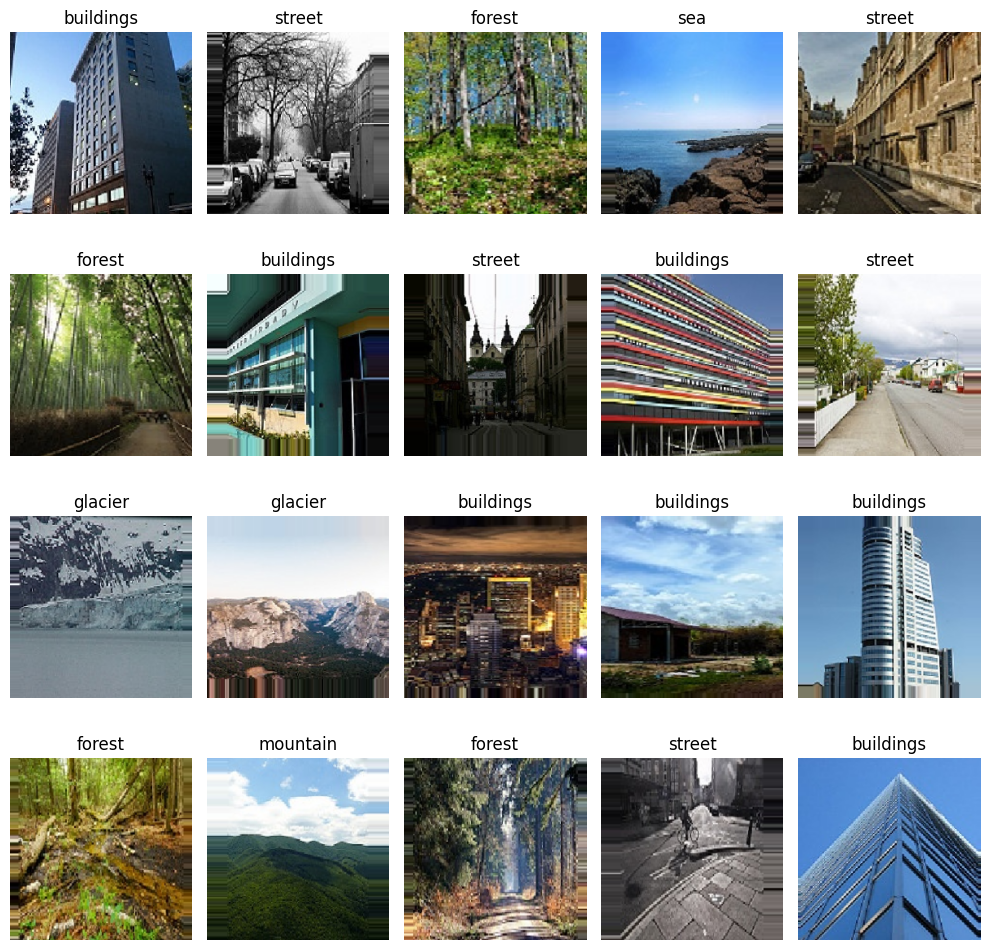

In [ ]:
# Plot sample images and their corresponding labels

fig, axes = plt.subplots(4, 5, figsize=(10, 10))

# Get the next batch of data
images_arr, labels = next(train_data_gen)

axes = axes.flatten()

for i, (img, ax) in enumerate(zip(images_arr, axes)):
    name = classes[labels[i]]
    ax.imshow(img)
    ax.set_title(f'{name}')
    ax.axis('off')

plt.tight_layout()
plt.show()

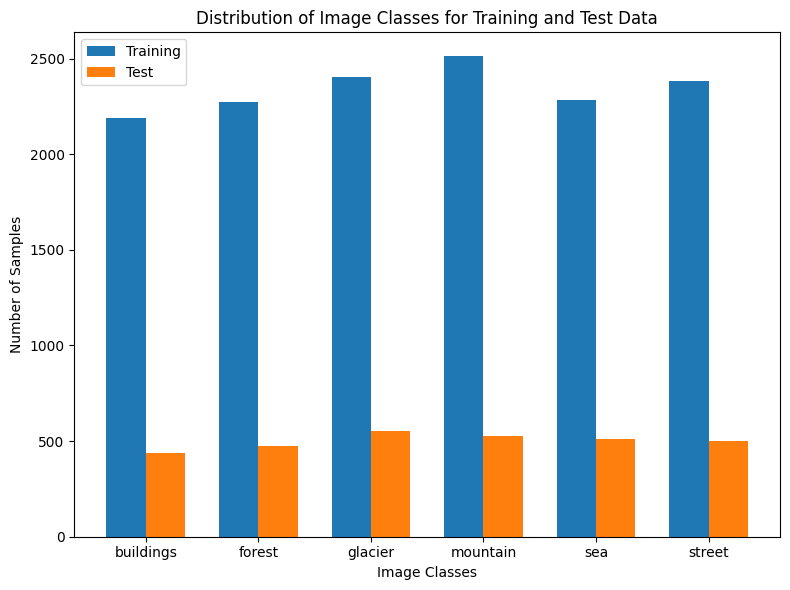

In [ ]:
# Plot a multiple bar chart to show the distribution of image classes for both the training and test data

fig, ax = plt.subplots(figsize=(8, 6))
bar_width = 0.35
index = range(len(class_labels))

ax.bar(index, train_class_counts, bar_width, label='Training')
ax.bar([i + bar_width for i in index], test_class_counts, bar_width, label='Test')

ax.set_xlabel('Image Classes')
ax.set_ylabel('Number of Samples')
ax.set_title('Distribution of Image Classes for Training and Test Data')
ax.set_xticks([i + bar_width/2 for i in index])
ax.set_xticklabels(class_labels)
ax.legend()
plt.tight_layout()
plt.show()

Show subplots of two pie charts showing the percentage distribution of training and test images across the six categories. The slices in the pie charts are displayed in sorted order based on the categories counts.

We highlight the category with the highest count by exploding the corresponding slice in the pie charts.

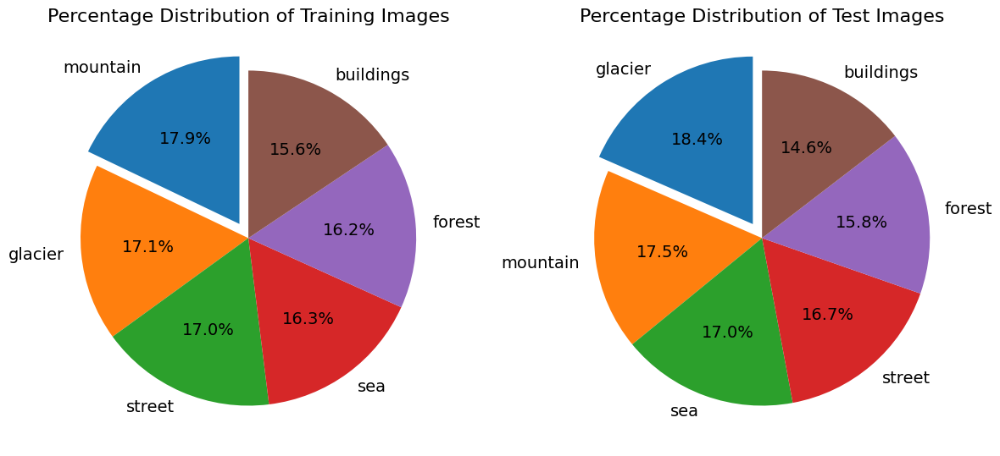

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

sorted_train_class_counts, sorted_train_labels = zip(*sorted(zip(train_class_counts, class_labels), reverse=True))
sorted_test_class_counts, sorted_test_labels = zip(*sorted(zip(test_class_counts, class_labels), reverse=True))

train_percentages = [count / train_data_gen.samples  * 100 for count in sorted_train_class_counts]
test_percentages = [count / test_data_gen.samples  * 100 for count in sorted_test_class_counts]

train_explode = [0.1 if count == max(sorted_train_class_counts) else 0 for count in sorted_train_class_counts]
test_explode = [0.1 if count == max(sorted_test_class_counts) else 0 for count in sorted_test_class_counts]

axes[0].pie(train_percentages, labels=sorted_train_labels, autopct='%1.1f%%',
            startangle=90, explode=train_explode, textprops={"size": 14})
axes[0].set_title('Percentage Distribution of Training Images', fontsize=16)


axes[1].pie(test_percentages, labels=sorted_test_labels, autopct='%1.1f%%',
            startangle=90, explode=test_explode, textprops={"size": 14})
axes[1].set_title('Percentage Distribution of Test Images', fontsize=16)


plt.tight_layout()
plt.show()

## Model Training From Scratch
The initial layers of our self trained model consist of convolutional layers, each followed by a max pooling layer to downsample the feature maps.

A Flatten layer is added next to reshape the output of the preceding convolutional and pooling layers into a flat vector, which can then be fed into the Dense layers for further processing (Dense layers require one-dimensional input). Dropout is applied to regularize the layers to improve generalization and prevent overfitting.

We added two Dense layers at the end of the model architecture. These Dense layers are responsible for transforming the learned features from the convolutional and pooling layers into predictions. The last Dense layer produces the final output, with the number of neurons equal to the number of classes in our data.

We're not using the softmax activation function for the output layer because we're opting to apply the logits directly. The logits are the raw, unnormalized output of the model.

The model is compiled with the Adam optimizer and Sparse Categorical Crossentropy loss function with from_logits=True. This means that we let the loss function handle the conversion of logits to probabilities internally, this allows for more numerical stability during training.

During training, the model is trained for 15 epochs using the training data and validation is performed on the test data.

In [ ]:
model = Sequential([
    Conv2D(32, (3, 3), padding="same", activation='relu',
           input_shape=train_data_gen.image_shape),
    MaxPool2D(pool_size=(2, 2)),

    Conv2D(32, (3, 3), padding="same", activation='relu'),
    MaxPool2D(pool_size=(2, 2)),

    Flatten(),
    Dropout(0.3),
    Dense(256, activation='relu'),
    Dropout(0.3),
    Dense(num_classes)
])

model.compile(optimizer="adam", metrics=["accuracy"],
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True))

model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_94 (Conv2D)          (None, 224, 224, 32)      896       
                                                                 
 max_pooling2d_4 (MaxPoolin  (None, 112, 112, 32)      0         
 g2D)                                                            
                                                                 
 conv2d_95 (Conv2D)          (None, 112, 112, 32)      9248      
                                                                 
 max_pooling2d_5 (MaxPoolin  (None, 56, 56, 32)        0         
 g2D)                                                            
                                                                 
 flatten (Flatten)           (None, 100352)            0         
                                                                 
 dropout_1 (Dropout)         (None, 100352)           

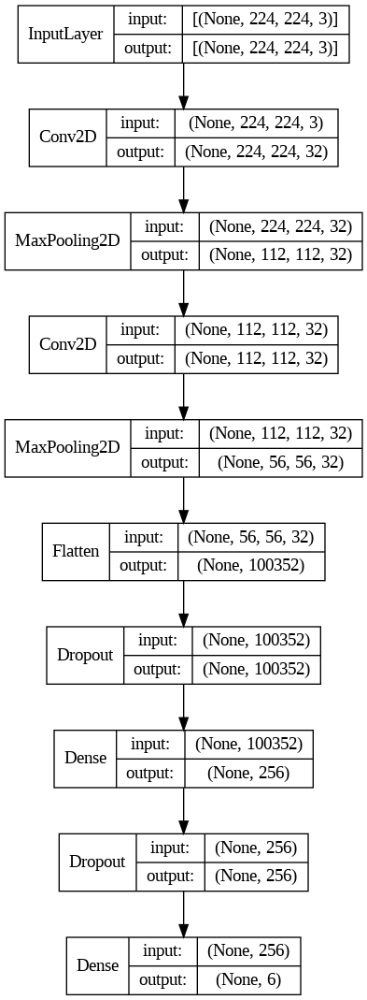

In [ ]:
plot_model(model, show_shapes=True, show_layer_names=False )

In [ ]:
epochs = 15

history = model.fit(
    train_data_gen,
    epochs=epochs,
    validation_data=test_data_gen
)

Epoch 1/15
439/439 [==============================] - 282s 641ms/step - loss: 1.2225 - accuracy: 0.5820 - val_loss: 0.8285 - val_accuracy: 0.6740
Epoch 2/15
439/439 [==============================] - 276s 629ms/step - loss: 0.8448 - accuracy: 0.6832 - val_loss: 0.7795 - val_accuracy: 0.7043
Epoch 3/15
439/439 [==============================] - 277s 631ms/step - loss: 0.7264 - accuracy: 0.7375 - val_loss: 0.6518 - val_accuracy: 0.7710
Epoch 4/15
439/439 [==============================] - 278s 633ms/step - loss: 0.6480 - accuracy: 0.7669 - val_loss: 0.6443 - val_accuracy: 0.7657
Epoch 5/15
439/439 [==============================] - 278s 633ms/step - loss: 0.5988 - accuracy: 0.7822 - val_loss: 0.5218 - val_accuracy: 0.8177
Epoch 6/15
439/439 [==============================] - 277s 629ms/step - loss: 0.5509 - accuracy: 0.8040 - val_loss: 0.5301 - val_accuracy: 0.8177
Epoch 7/15
439/439 [==============================] - 276s 629ms/step - loss: 0.5276 - accuracy: 0.8117 - val_loss: 0.4995 -

### Training and Validation Curve

To gain insights into the model's performance, identify issues such as overfitting or underfitting, and make informed decisions about hyperparameter tuning and model architecture adjustments, we plot the training and validation curve.

In [ ]:
# Define a function for plotting the training and validation curve
def plot_history(history, num_epochs):
    fig, axes = plt.subplots(1, 2, figsize=(12, 6))

    axes[0].plot(history['accuracy'], label='Training Accuracy')
    axes[0].plot(history['val_accuracy'], label='Test Accuracy')
    axes[0].set_xlabel('Epoch')
    axes[0].set_ylabel('Accuracy')
    axes[0].set_title('Training and Test Accuracy')
    axes[0].legend(loc="lower right")
    axes[0].set_xlim(0, num_epochs - 1)
    axes[0].grid()

    axes[1].plot(history['loss'], label='Training Loss')
    axes[1].plot(history['val_loss'], label='Test Loss')
    axes[1].set_xlabel('Epoch')
    axes[1].set_ylabel('Loss')
    axes[1].set_title('Training and Test Loss')
    axes[1].legend(loc='upper right')
    axes[1].set_xlim(0, num_epochs - 1)
    axes[1].grid()

    plt.show()

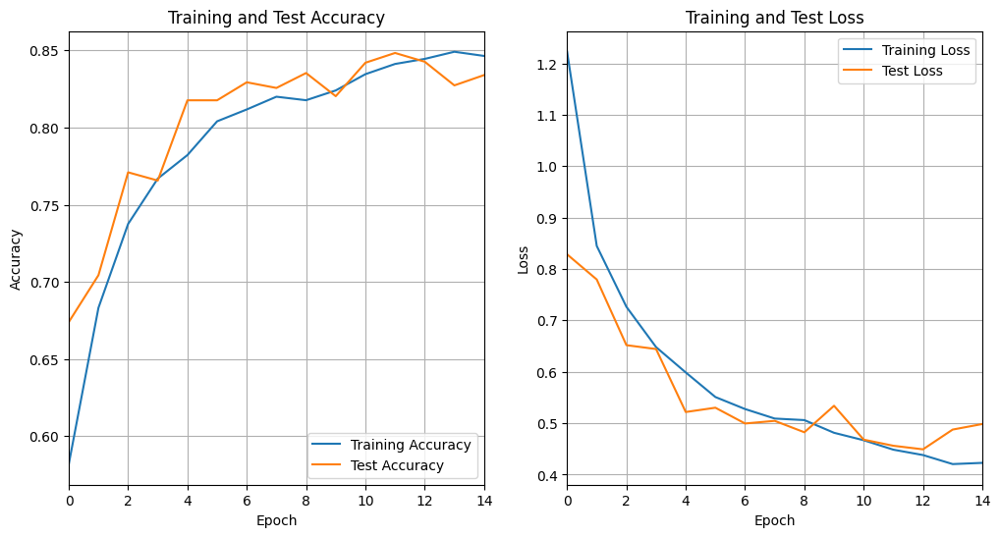

In [ ]:
plot_history(history.history, 15)

Since we didn't set a checkpoint to automatically save the model, we can manually save it for easy assess at a later time.

This allows us train the model once, save it, and then reload it multiple times to fine-tune hyperparameters, evaluate performance, and make predictions on different datasets, or compare with other models without incurring the computational cost of retraining.

In [ ]:
model_path = os.path.join(data_directory, f"checkpoints/custom_model{session_time}")
model.save(model_path)

with open(os.path.join(model_path, "history.pkl"), 'wb') as file:
    # We use pickle to convert the history object into a binary
    # format and write it to a file.
    pickle.dump(history.history, file)

## Tranfer Learning With InceptionV3

In order to achieve a higher accuracy, we use a pre-trained **InceptionV3** model to implement **Transfer Learning**. We utilized the Keras library to load the InceptionV3 model with pre-trained weights, and the fully connected outer layer removed.

Then we added custom layers on top of the pre-trained model for training on our specific dataset. The InceptionV3 model was originally trained on the ImageNet dataset

In [ ]:
base_model_inception = InceptionV3(weights='imagenet', include_top=False, input_shape=test_data_gen.image_shape)
#Freeze all the layers
base_model_inception.trainable = False

model_inception = Sequential([
    base_model_inception,
    GlobalAveragePooling2D(),
    Dense(128, activation='relu'),
    Dropout(0.1),
    Dense(num_classes)
])

model_inception.compile(
  optimizer='adam',
  loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
  metrics=['accuracy'])

model_inception.summary(show_trainable=True)

Model: "sequential"
____________________________________________________________________________
 Layer (type)                Output Shape              Param #   Trainable  
 inception_v3 (Functional)   (None, 5, 5, 2048)        2180278   N          
                                                       4                    
                                                                            
 global_average_pooling2d_1  (None, 2048)              0         Y          
  (GlobalAveragePooling2D)                                                  
                                                                            
 dense_1 (Dense)             (None, 128)               262272    Y          
                                                                            
 dropout_1 (Dropout)         (None, 128)               0         Y          
                                                                            
 dense_2 (Dense)             (None, 6)                 7

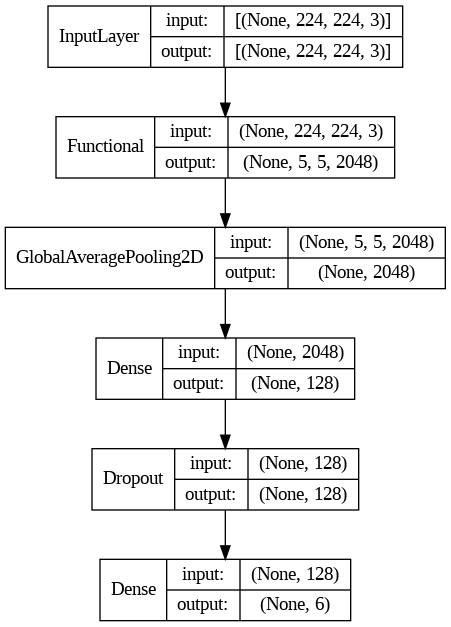

In [ ]:
plot_model(model_inception, show_shapes=True, show_layer_names=False)

In [ ]:
EPOCHS = 10

history_inception = model_inception.fit(train_data_gen,
                              epochs=EPOCHS,
                              validation_data=test_data_gen)

Epoch 1/10
439/439 [==============================] - 190s 414ms/step - loss: 0.3885 - accuracy: 0.8579 - val_loss: 0.2593 - val_accuracy: 0.8997
Epoch 2/10
439/439 [==============================] - 176s 402ms/step - loss: 0.2915 - accuracy: 0.8899 - val_loss: 0.2364 - val_accuracy: 0.9127
Epoch 3/10
439/439 [==============================] - 177s 402ms/step - loss: 0.2707 - accuracy: 0.9013 - val_loss: 0.2636 - val_accuracy: 0.9040
Epoch 4/10
439/439 [==============================] - 176s 400ms/step - loss: 0.2541 - accuracy: 0.9067 - val_loss: 0.2355 - val_accuracy: 0.9120
Epoch 5/10
439/439 [==============================] - 177s 403ms/step - loss: 0.2444 - accuracy: 0.9081 - val_loss: 0.2340 - val_accuracy: 0.9113
Epoch 6/10
439/439 [==============================] - 175s 398ms/step - loss: 0.2423 - accuracy: 0.9106 - val_loss: 0.2239 - val_accuracy: 0.9167
Epoch 7/10
439/439 [==============================] - 175s 398ms/step - loss: 0.2357 - accuracy: 0.9121 - val_loss: 0.2341 -

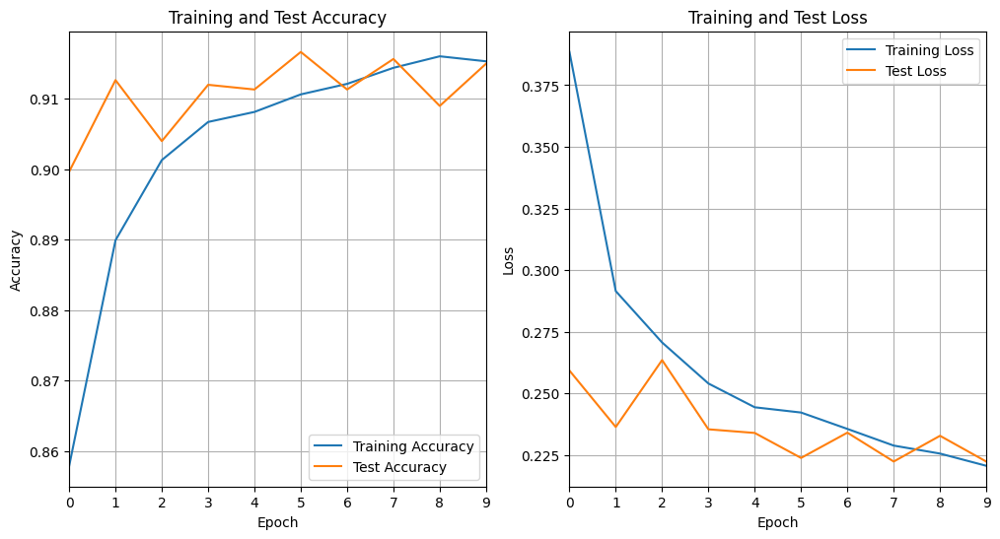

In [ ]:
plot_history(history_inception.history, 10)

## Tranfer Learning Using ResNet50V2

We setup another transfer learning model that utilizes the ResNet50V2 architecture, a deep convolutional neural network known for its effectiveness in image recognition tasks. ResNet50V2 consists of multiple residual blocks, each containing several convolutional layers with skip connections.

To adapt ResNet50V2 for our specific task, we employed transfer learning by leveraging pre-trained weights obtained from training on the ImageNet dataset and capitalizing on the feature extraction capabilities learned from ImageNet.

In our architecture, after loading the pretrained model with keras, we added a GlobalAveragePooling2D layer to reduce the spatial dimensions of the feature maps generated by ResNet50V2's convolutional layers. This pooling layer aggregates spatial information across the feature maps, condensing them into a one-dimensional vector while preserving essential features.

Subsequently, we appended two Dense layer with the output layer containing neurons corresponding to the number of classes in our dataset. We also added a Dropout layer to regularise the model and a BatchNormalization layer to normalize the activations, leading to faster convergence during training and improved generalization performance.

In [ ]:
base_model_resnet = ResNet50V2(weights='imagenet', include_top=False, input_shape=test_data_gen.image_shape)
# Freeze all the layers
base_model_resnet.trainable = False

model_resnet = Sequential([
    base_model_resnet,
    GlobalAveragePooling2D(),
    Dense(256, activation='relu'),
    Dropout(0.3),
    BatchNormalization(),
    Dense(num_classes)
])

model_resnet.compile(
  optimizer="adam",
  loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
  metrics=['accuracy'])

model_resnet.summary()

Model: "sequential_25"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet50v2 (Functional)     (None, 7, 7, 2048)        23564800  
                                                                 
 global_average_pooling2d_2  (None, 2048)              0         
 5 (GlobalAveragePooling2D)                                      
                                                                 
 dense_51 (Dense)            (None, 256)               524544    
                                                                 
 dropout_27 (Dropout)        (None, 256)               0         
                                                                 
 batch_normalization_7 (Bat  (None, 256)               1024      
 chNormalization)                                                
                                                                 
 dense_52 (Dense)            (None, 6)               

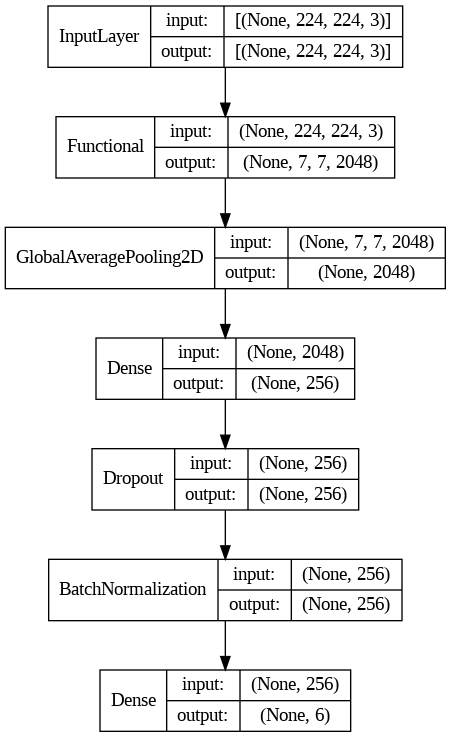

In [ ]:
plot_model(model_resnet, show_shapes=True, show_layer_names=False)

In [ ]:
EPOCHS = 10

history_resnet = model_resnet.fit(train_data_gen,
                              epochs=EPOCHS,
                              validation_data=test_data_gen)

Epoch 1/10
439/439 [==============================] - 190s 422ms/step - loss: 0.3602 - accuracy: 0.8729 - val_loss: 0.2525 - val_accuracy: 0.9013
Epoch 2/10
439/439 [==============================] - 181s 412ms/step - loss: 0.2703 - accuracy: 0.9010 - val_loss: 0.2210 - val_accuracy: 0.9157
Epoch 3/10
439/439 [==============================] - 181s 411ms/step - loss: 0.2509 - accuracy: 0.9062 - val_loss: 0.2025 - val_accuracy: 0.9217
Epoch 4/10
439/439 [==============================] - 185s 420ms/step - loss: 0.2385 - accuracy: 0.9130 - val_loss: 0.2159 - val_accuracy: 0.9157
Epoch 5/10
439/439 [==============================] - 184s 419ms/step - loss: 0.2280 - accuracy: 0.9141 - val_loss: 0.2086 - val_accuracy: 0.9163
Epoch 6/10
439/439 [==============================] - 179s 408ms/step - loss: 0.2179 - accuracy: 0.9203 - val_loss: 0.2056 - val_accuracy: 0.9163
Epoch 7/10
439/439 [==============================] - 183s 418ms/step - loss: 0.2136 - accuracy: 0.9199 - val_loss: 0.2076 -

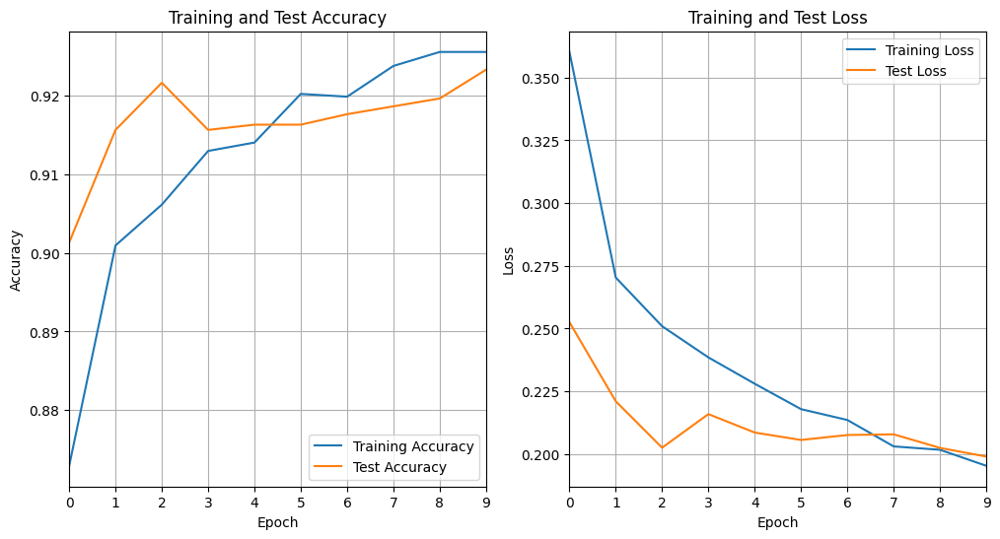

In [ ]:
plot_history(history_resnet.history, 10)

## Fine Tuning The Inception Transfer Learning Model

To see if we can further increase the performance of the Inception Transfer Learnining Model, we fine tune the model by unfreezing the last 20 layers of the InceptionV3 pre-trained model to allow them to learn task-specific features from our dataset.

We implemented the following callbacks in the training process to prevent over-fitting, monitor the training process, and ensure optimal performance while capturing more generic features:

1. **Early Stopping**: This monitors the validation loss during training, and stops training early if it stops decreasing. It optimises the training by halting it when the model's performance on the validation set no longer improves.
2. **Model Checkpoint**: We set this callback to save the model when the lowest validation loss is obtained, overwriting the previous saved model with the current best model. This ensures the preservation of the best-performing model.
3. **Reduce Learning Rate OnPlateau**: We setup this callback to reduce the learning rate when the validation loss has stopped decreasing. It helps to prevent over fitting and allows the model to converge more effectively.

In [ ]:
# Define callbacks for early stopping
early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=5,
    restore_best_weights=True,
    verbose=1
)

# Define callbacks for reducing learning rate
reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',
    mode='min',
    factor=0.2,
    patience=2,
    verbose=1
)

# Define the ModelCheckpoint callback for saving the best model
ck_path = os.path.join(data_directory, f"checkpoints/model_inception_tuned{session_time}")
checkpoint_callback = ModelCheckpoint(
  filepath= ck_path,
  save_best_only=True,
  monitor='val_loss',
  verbose=1
  )

In [ ]:
# Freeze all layers except for the last 20 layers
base_model_inception.trainable = True
for layer in base_model_inception.layers[:-20]:
    layer.trainable = False

# Check the last 22 layers to be sure that the last 20 layers have been unfreezed
# and also check the name of the unfreezed layers
for layer_number, layer in enumerate(base_model_inception.layers[-22:]):
    print(layer_number, layer.name, layer.trainable)

0 conv2d_181 False
1 conv2d_182 False
2 conv2d_185 True
3 conv2d_186 True
4 average_pooling2d_17 True
5 conv2d_179 True
6 batch_normalization_181 True
7 batch_normalization_182 True
8 batch_normalization_185 True
9 batch_normalization_186 True
10 conv2d_187 True
11 batch_normalization_179 True
12 activation_181 True
13 activation_182 True
14 activation_185 True
15 activation_186 True
16 batch_normalization_187 True
17 activation_179 True
18 mixed9_1 True
19 concatenate_3 True
20 activation_187 True
21 mixed10 True


In [ ]:
# Recompile the model so that changes are take into account
model_inception.compile(optimizer=tf.keras.optimizers.Adam(1e-6),
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

model_inception.summary(show_trainable=True)

Model: "sequential"
____________________________________________________________________________
 Layer (type)                Output Shape              Param #   Trainable  
 inception_v3 (Functional)   (None, 5, 5, 2048)        2180278   Y          
                                                       4                    
                                                                            
 global_average_pooling2d_1  (None, 2048)              0         Y          
  (GlobalAveragePooling2D)                                                  
                                                                            
 dense_1 (Dense)             (None, 128)               262272    Y          
                                                                            
 dropout_1 (Dropout)         (None, 128)               0         Y          
                                                                            
 dense_2 (Dense)             (None, 6)                 7

In [ ]:
# Train the model
history_inception_tuned = model_inception.fit(train_data_gen, epochs=15,
                                        validation_data=test_data_gen,
                                        callbacks=[reduce_lr, early_stopping,
                                                   checkpoint_callback])

Epoch 1/15
439/439 [==============================] - ETA: 0s - loss: 0.2574 - accuracy: 0.9040
Epoch 1: val_loss improved from inf to 0.22816, saving model to /content/drive/MyDrive/image_classification_keras/checkpoints/model_inception_tuned
439/439 [==============================] - 213s 470ms/step - loss: 0.2574 - accuracy: 0.9040 - val_loss: 0.2282 - val_accuracy: 0.9207 - lr: 1.0000e-06
Epoch 2/15
439/439 [==============================] - ETA: 0s - loss: 0.2353 - accuracy: 0.9141
Epoch 2: val_loss improved from 0.22816 to 0.21986, saving model to /content/drive/MyDrive/image_classification_keras/checkpoints/model_inception_tuned
439/439 [==============================] - 204s 464ms/step - loss: 0.2353 - accuracy: 0.9141 - val_loss: 0.2199 - val_accuracy: 0.9240 - lr: 1.0000e-06
Epoch 3/15
439/439 [==============================] - ETA: 0s - loss: 0.2218 - accuracy: 0.9164
Epoch 3: val_loss improved from 0.21986 to 0.21712, saving model to /content/drive/MyDrive/image_classificat

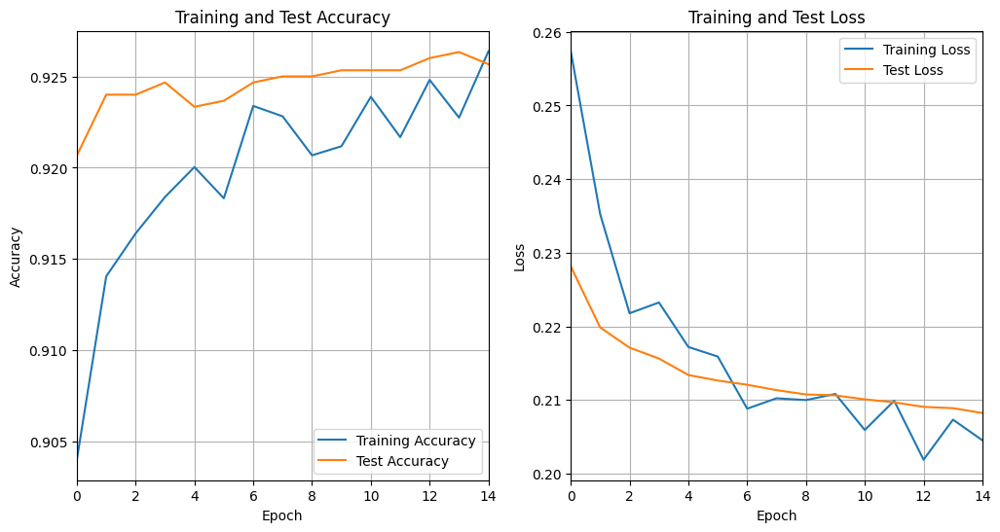

In [ ]:
plot_history(history_inception_tuned.history, 15)

Since the training history object returned by the **fit** method when training the model isn't saved by the ModelCheckpoint callback, we manually save it in the same folder as the saved models.

In [ ]:
with open(os.path.join(ck_path, "history.pkl"), 'wb') as file:
    # We use pickle to convert the history object into a binary
    # format and write it to a file.
    pickle.dump(history_inception_tuned.history, file)

## Fine Tuning the ResNet Transfer Learning Model

To see if we can further increase the performance of the Resnet Transfer Learnining Model, we fine-tune the model's parameters to suit our dataset by unfreezing all the layers of the conv5 block of the ResNet50V2 pre-trained model to allow them to learn task-specific features from our dataset.

We implemented the same callbacks we used when fine tuning the Inception Transfer learning model.

In [ ]:
# Define callbacks for early stopping
early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=5,
    restore_best_weights=True,
    verbose=1
)

# Define callbacks for reducing learning rate
reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',
    mode='min',
    factor=0.2,
    patience=2,
    verbose=1
)

# Define the ModelCheckpoint callback for saving the best model
ck_path = os.path.join(data_directory, f"checkpoints/model_resnet_tuned{session_time}")
checkpoint_callback = ModelCheckpoint(
  filepath= ck_path,
  save_best_only=True,
  monitor='val_loss',
  verbose=1
  )

In [ ]:
# Freeze all layers except for the layers in conv5 blocks
base_model_resnet.trainable = True
for layer in base_model_resnet.layers:
    if 'conv5' not in layer.name:
        layer.trainable = False

In [ ]:
# Recompile the model so that changes are take into account
model_resnet.compile(optimizer=tf.keras.optimizers.Adam(5e-6),
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

model_resnet.summary(show_trainable=True)

Model: "sequential_21"
____________________________________________________________________________
 Layer (type)                Output Shape              Param #   Trainable  
 resnet50v2 (Functional)     (None, 7, 7, 2048)        2356480   Y          
                                                       0                    
                                                                            
 global_average_pooling2d_2  (None, 2048)              0         Y          
 1 (GlobalAveragePooling2D)                                                 
                                                                            
 dense_43 (Dense)            (None, 128)               262272    Y          
                                                                            
 dropout_23 (Dropout)        (None, 128)               0         Y          
                                                                            
 batch_normalization (Batch  (None, 128)             

In [ ]:
# Train the model
history_resnet_tuned = model_resnet.fit(train_data_gen, epochs=10,
                                        validation_data=test_data_gen,
                                        callbacks=[reduce_lr, early_stopping,
                                                   checkpoint_callback])

Epoch 1/10
439/439 [==============================] - ETA: 0s - loss: 0.3389 - accuracy: 0.8755
Epoch 1: val_loss improved from inf to 0.25683, saving model to /content/drive/MyDrive/image_classification_keras/checkpoints/trial_resnet_tuned1710743640
439/439 [==============================] - 217s 478ms/step - loss: 0.3389 - accuracy: 0.8755 - val_loss: 0.2568 - val_accuracy: 0.9070 - lr: 5.0000e-06
Epoch 2/10
439/439 [==============================] - ETA: 0s - loss: 0.2581 - accuracy: 0.9049
Epoch 2: val_loss improved from 0.25683 to 0.23594, saving model to /content/drive/MyDrive/image_classification_keras/checkpoints/trial_resnet_tuned1710743640
439/439 [==============================] - 211s 480ms/step - loss: 0.2581 - accuracy: 0.9049 - val_loss: 0.2359 - val_accuracy: 0.9127 - lr: 5.0000e-06
Epoch 3/10
439/439 [==============================] - ETA: 0s - loss: 0.2307 - accuracy: 0.9174
Epoch 3: val_loss improved from 0.23594 to 0.22064, saving model to /content/drive/MyDrive/ima

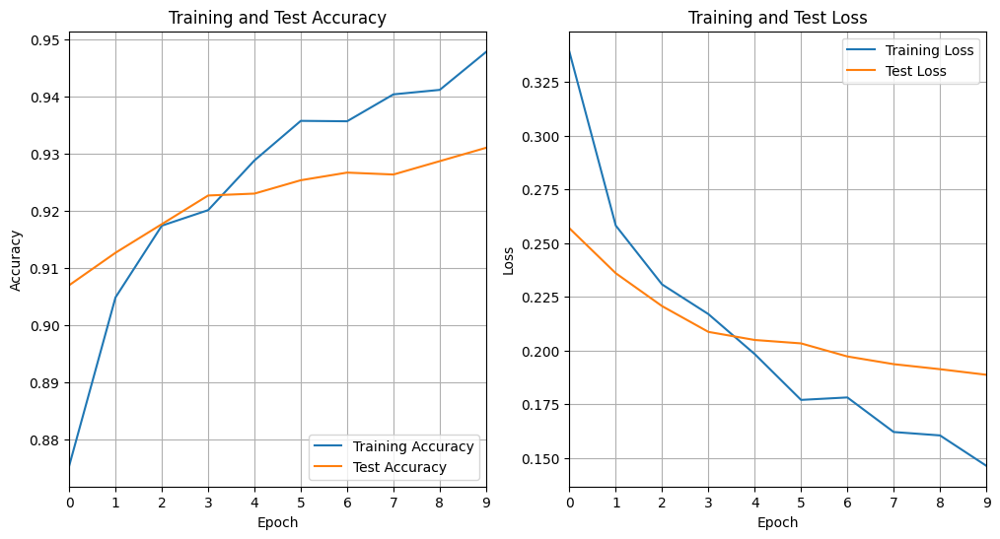

In [ ]:
num_epochs = early_stopping.stopped_epoch if early_stopping.stopped_epoch else 10
plot_history(history_resnet_tuned.history, num_epochs)

In [ ]:
with open(os.path.join(ck_path, "history.pkl"), 'wb') as file:
    # We use pickle to convert the history object into a binary
    # format and write it to a file.
    pickle.dump(history_resnet_tuned.history, file)

## Predictions

The test data generator is modified to return all the images, because selecting from a batch will likely return images of the same class since we set shuffle to false for the test data.

We select 20 random images and pass the same selected images to our models for prediction. The labels for wrongly predicted images are shown in red while that of correct predictions are shown in green.

In [ ]:
# Generate all the test data from the specified directory
test_data_gen.reset()
test_data_gen.batch_size = test_data_gen.samples

In [ ]:
selected_indices = np.random.choice(test_data_gen.samples, size=20, replace=False)
test_data = next(test_data_gen)

In [ ]:
def plot_predictions(model):
    fig, axes = plt.subplots(4, 5, figsize=(10, 10))
    images, labels = test_data

    selected_images = images[selected_indices]
    selected_labels = labels[selected_indices]

    selected_pred_probabilities = model.predict(selected_images)
    predictions = np.argmax(selected_pred_probabilities, axis=1)

    axes = axes.flatten()

    for i, (img, ax) in enumerate(zip(selected_images, axes)):
        true_labels = classes[selected_labels[i]]
        predicted_labels = classes[predictions[i]]
        ax.imshow(img)
        ax.set_title(f'True: {true_labels}\nPredicted: {predicted_labels}', loc='left',
                     color='green' if true_labels == predicted_labels else 'red')
        ax.axis('off')

    plt.tight_layout()
    plt.show()

1/1 [==============================] - 0s 457ms/step


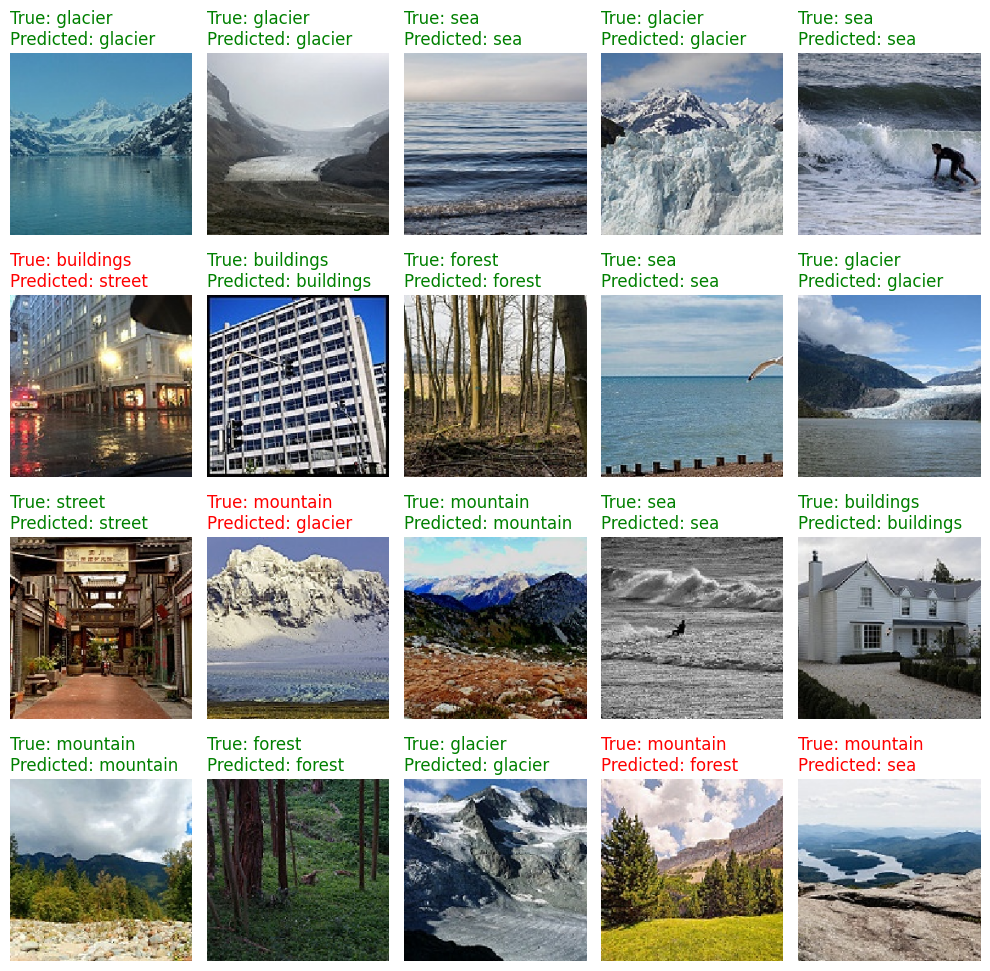

In [ ]:
# Plot sample predictions made by the model we trained from scratch
plot_predictions(model)

1/1 [==============================] - 4s 4s/step


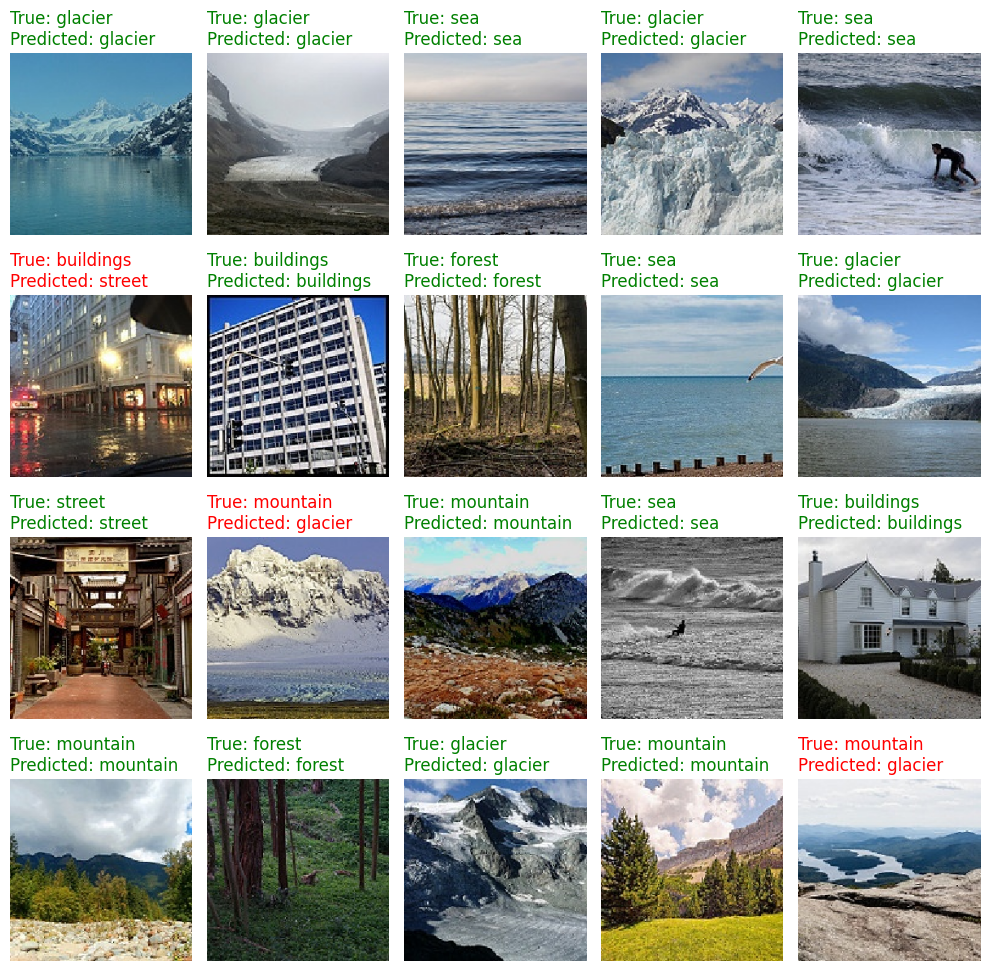

In [ ]:
# Plot sample predictions made by the inception transfer learning model
plot_predictions(model_inception)

1/1 [==============================] - 3s 3s/step


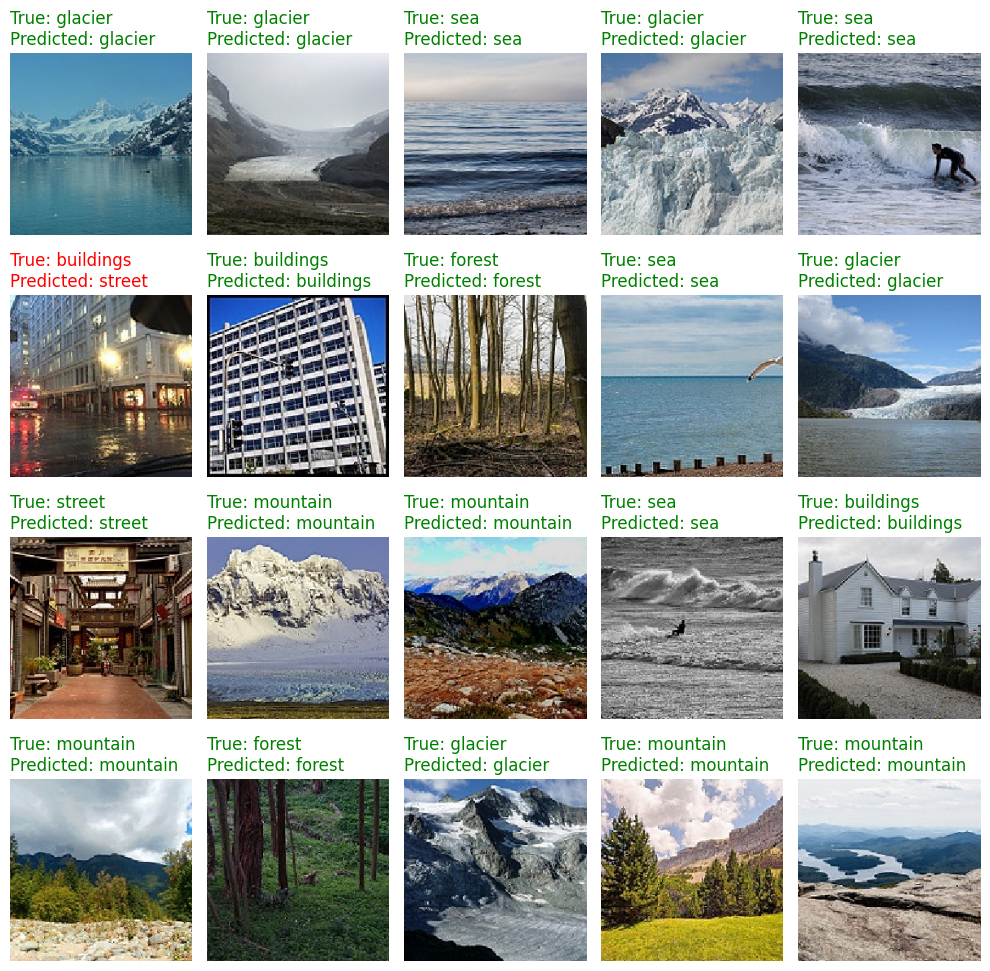

In [ ]:
# Plot predictions made by the resnet transfer learning model
plot_predictions(model_resnet)

The dataset we are working with has training, test, and predictions data. So far, we have trained our models with the training data, and made validations with the test data. In the code below, we'll make predictions with the prediction data to see how well our models will perform on images that were not used in training or validation.

The prediction data doesn't have the true labels of the images, so we can only visually compare the predictions made by our models on samples of the prediction data.

In [ ]:
# Define function to load and process only 20 of the prediction data
def load_and_preprocess_images(directory):
    image_files = os.listdir(directory)
    random_images = random.sample(image_files, min(20, len(image_files)))
    images = []
    for image_file in random_images:
        image_path = os.path.join(directory, image_file)
        img = Image.open(image_path)
        img = img.resize(IMAGE_SHAPE)
        img = np.array(img) / 255.0
        images.append(img)
    return np.array(images)

# Load and process the prediction data
prediction_data = load_and_preprocess_images(pred_dir)

1/1 [==============================] - 0s 31ms/step


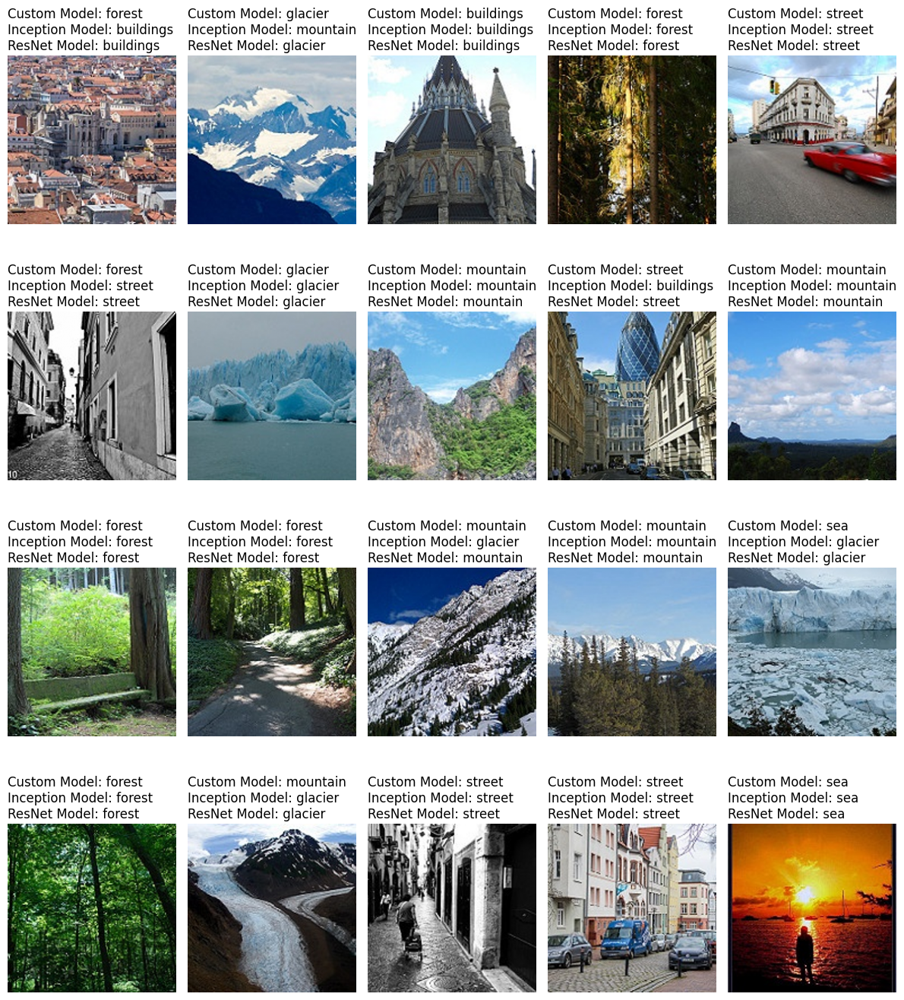

In [ ]:
# Plot the predictions made on the prediction data by the three models
# Note that the true label of the prediction data were not given, so we
# only visually compare the predictions made on the sample prediction data
fig, axes = plt.subplots(4, 5, figsize=(12, 14))

custom_model_pred_probs = model.predict(prediction_data)
model_inception_pred_probs = model_inception.predict(prediction_data)
model_resnet_pred_probs = model_resnet.predict(prediction_data)

custom_model_pred = np.argmax(custom_model_pred_probs, axis=1)
model_inception_pred = np.argmax(model_inception_pred_probs, axis=1)
model_resnet_pred = np.argmax(model_resnet_pred_probs, axis=1)

axes = axes.flatten()

for i, ax in enumerate(axes):
    ax.imshow(prediction_data[i])
    ax.set_title(f'Custom Model: {classes[custom_model_pred[i]]}\nInception Model: {classes[model_inception_pred[i]]}\nResNet Model: {classes[model_resnet_pred[i]]}',
                 loc='left')
    ax.axis('off')

plt.tight_layout()
plt.show()

## Evaluating The Models

We evaluated our model's performance using a confusion matrix and a classification report. The confusion matrix provides a visual representation of our model's predictions compared to the actual values.

The classification report presents metrics such as precision, recall, and F1-score for each class in our dataset.

Precision measures the accuracy of positive predictions, it give the proportion of true positives to the amount of total positives that the model predicts. It answers the question “Out of all the positive predictions we made, how many were true?”

Recall assesses the model's ability to capture positive instances, it answers the question “Out of all the data points that should be predicted as true, how many did we correctly predict as true?.

The F1-score is the harmonic mean of the precision and recall. Additionally, the support metric indicates the number of actual occurrences of each class.

In [ ]:
def plot_confusion_matrix(predictions):
    # Compute confusion matrix
    conf_matrix = confusion_matrix(test_data_gen.labels, np.argmax(predictions, axis=1))

    # Plot confusion matrix as a heatmap
    plt.figure(figsize=(8, 6))
    sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='viridis',
                xticklabels=class_indices, yticklabels=class_indices)
    plt.xlabel('Predicted labels')
    plt.ylabel('True labels')
    plt.title('Confusion Matrix for Model')
    plt.show()

In [ ]:
def compute_classification_report(predictions):
    predicted_labels = np.argmax(predictions, axis=1)

    # Get the true labels from the test generator
    true_labels = test_data_gen.classes

    # Get the class labels
    class_labels = list(test_data_gen.class_indices.keys())

    # Generate the classification report
    report = classification_report(true_labels, predicted_labels, target_names=class_labels)

    return report

In [ ]:
# Reset the test data to generate images in batches
test_data_gen.reset()
test_data_gen.batch_size = BATCH_SIZE

model_predictions = model.predict(test_data_gen)
model_inception_predictions = model_inception.predict(test_data_gen)
model_resnet_predictions = model_resnet.predict(test_data_gen)

94/94 [==============================] - 10s 101ms/step


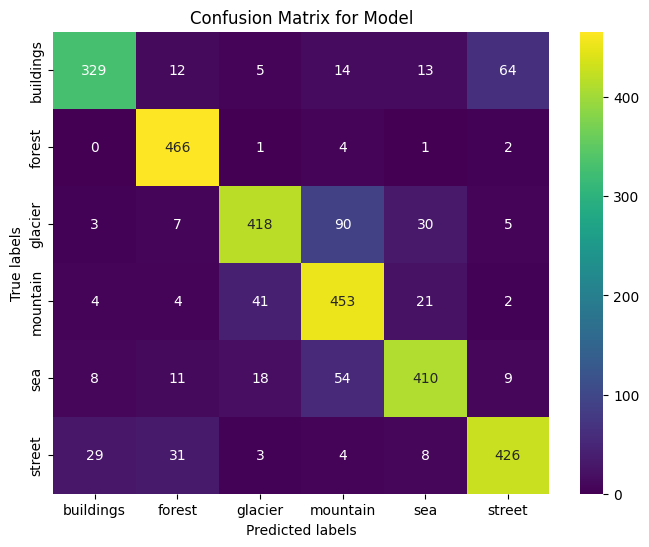

In [ ]:
# Plot the confusion matrix of predictions made by the model we trained from scratch
plot_confusion_matrix(model_predictions)

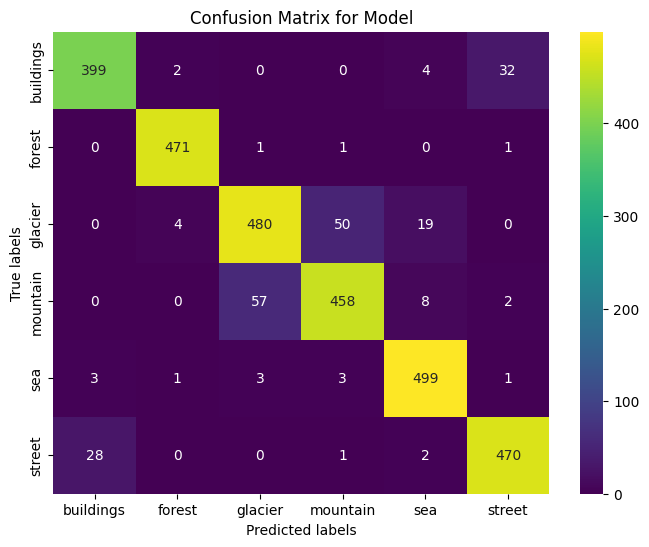

In [ ]:
# Plot the confusion matrix of predictions made by the inception transfer learning model
plot_confusion_matrix(model_inception_predictions)

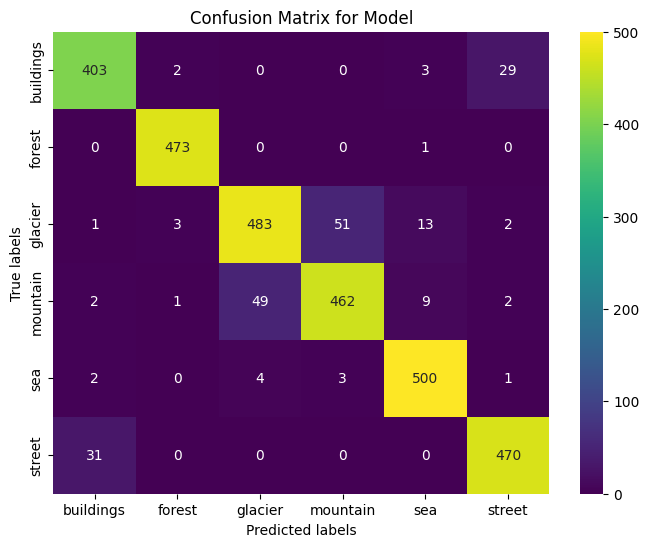

In [ ]:
# Plot the confusion matrix of predictions made by the resnet transfer learning model
plot_confusion_matrix(model_resnet_predictions)

In [ ]:
# Show classification report of predictions made by the model we trained from scratch
print(compute_classification_report(model_predictions))

              precision    recall  f1-score   support

   buildings       0.88      0.75      0.81       437
      forest       0.88      0.98      0.93       474
     glacier       0.86      0.76      0.80       553
    mountain       0.73      0.86      0.79       525
         sea       0.85      0.80      0.83       510
      street       0.84      0.85      0.84       501

    accuracy                           0.83      3000
   macro avg       0.84      0.83      0.83      3000
weighted avg       0.84      0.83      0.83      3000



In [ ]:
# Show classification report of predictions made by the inception transfer learning model
print(compute_classification_report(model_inception_predictions))

              precision    recall  f1-score   support

   buildings       0.93      0.91      0.92       437
      forest       0.99      0.99      0.99       474
     glacier       0.89      0.87      0.88       553
    mountain       0.89      0.87      0.88       525
         sea       0.94      0.98      0.96       510
      street       0.93      0.94      0.93       501

    accuracy                           0.93      3000
   macro avg       0.93      0.93      0.93      3000
weighted avg       0.93      0.93      0.93      3000



In [ ]:
# Show classification report of predictions made by the resnet transfer learning model
print(compute_classification_report(model_resnet_predictions))

              precision    recall  f1-score   support

   buildings       0.92      0.92      0.92       437
      forest       0.99      1.00      0.99       474
     glacier       0.90      0.87      0.89       553
    mountain       0.90      0.88      0.89       525
         sea       0.95      0.98      0.97       510
      street       0.93      0.94      0.94       501

    accuracy                           0.93      3000
   macro avg       0.93      0.93      0.93      3000
weighted avg       0.93      0.93      0.93      3000



## Extra - Reloading The Models
We can reload the architecture, weights, and optimizer configuration of our saved models to enable us easily access it without having to retrain it from scratch and incurr the computational cost of retraining.

In [ ]:
# Construct the path to the directory where the models and their training history are saved
# Note: get the session_time from the folder name (the numeric part) of the
# specific model to restore if the model was saved in another session
custom_model_path = os.path.join(data_directory, f"checkpoints/custom_model{session_time}")
history_custom_path = os.path.join(custom_model_path, "history.pkl")

model_inception_path = os.path.join(data_directory, f"checkpoints/model_inception_tuned{session_time}")
history_inception_path = os.path.join(model_inception_path, "history.pkl")

model_resnet_path = os.path.join(data_directory, f"checkpoints/model_resnet_tuned{session_time}")
history_resnet_path = os.path.join(model_resnet_path, "history.pkl")

In [ ]:
def show_evaluation(model, model_name):
    test_loss, test_accuracy = model.evaluate(test_data_gen)

    # Print the evaluation result
    print(f"Test Loss for {model_name}:  {round(test_loss, 3)}")
    print(f"Test Accuracy for {model_name}:  {round(test_accuracy, 3)}\n\n")

94/94 [==============================] - 10s 99ms/step - loss: 0.4984 - accuracy: 0.8340
Test Loss for Custom Model:  0.498
Test Accuracy for Custom Model:  0.834




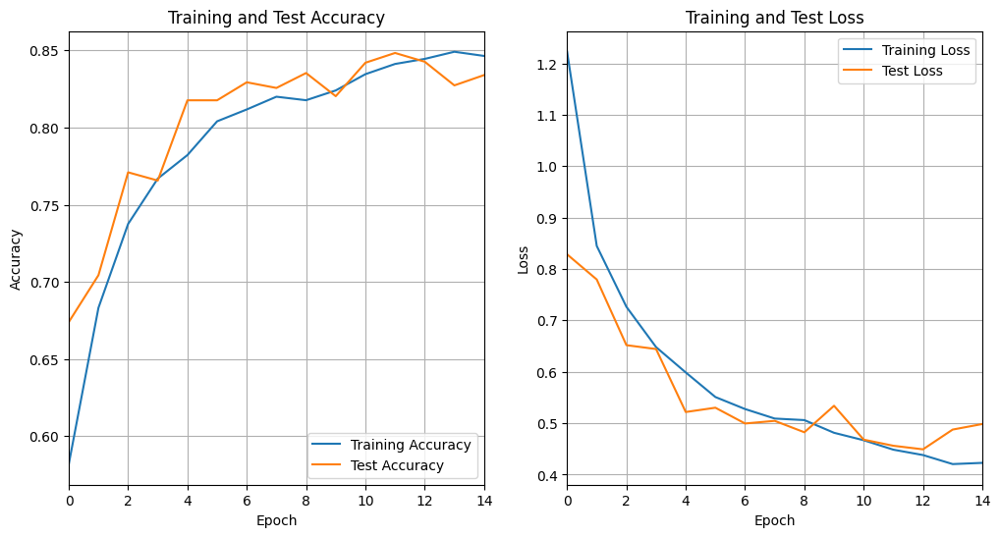

In [ ]:
reloaded_model = tf.keras.models.load_model(custom_model_path)

with open(history_custom_path, 'rb') as file:
    # Deserialize and load the training history from the opened file using pickle
    reloaded_history_custom_path = pickle.load(file)

# We can see that the plot is the same with the history plot of the model
# that we trained from scratch (the model we saved)
show_evaluation(reloaded_model, "Custom Model")
plot_history(reloaded_history_custom_path, 15)

In [ ]:
reloaded_model_inception = tf.keras.models.load_model(model_inception_path)

# Show the model evaluation
show_evaluation(reloaded_model_inception, "Inception Transfer Learning Model")

94/94 [==============================] - 17s 139ms/step - loss: 0.2082 - accuracy: 0.9257
Test Loss for Inception Transfer Learning Model:  0.208
Test Accuracy for Inception Transfer Learning Model:  0.926




In [ ]:
reloaded_model_resnet = tf.keras.models.load_model(model_resnet_path)

# Show the model evaluation
show_evaluation(reloaded_model_resnet, "Resnet Transfer Learning Model")

94/94 [==============================] - 11s 110ms/step - loss: 0.1887 - accuracy: 0.9310
Test Loss for Resnet Transfer Learning Model:  0.189
Test Accuracy for Resnet Transfer Learning Model:  0.931


